In [1]:
import os
from glob import glob
from sklearn.model_selection import train_test_split
import random
from collections import Counter, defaultdict
import cv2
import numpy as np
from torchvision import transforms
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torchvision.models as models

# --- Data Loading and Preprocessing ---

def load_image_sequences(root_dir, stack_size=5):
    sequences = []
    for subject in os.listdir(root_dir):
        subject_path = os.path.join(root_dir, subject)
        if not os.path.isdir(subject_path):
            continue
        for label in os.listdir(subject_path):
            label_path = os.path.join(subject_path, label)
            if not os.path.isdir(label_path):
                continue
            for action in os.listdir(label_path):
                action_path = os.path.join(label_path, action)
                if not os.path.isdir(action_path):
                    continue
                image_paths = sorted(glob(os.path.join(action_path, '*.jpg')))
                # Pastikan cukup frame untuk stacking
                if len(image_paths) < stack_size:
                    continue
                # Ekstrak nama aksi tanpa angka depan jika ada
                action_name = "_".join(action.split('_')[1:]) if '_' in action else action
                sequences.append({
                    'subject': subject,
                    'label': label,
                    'action': action_name,
                    'image_paths': image_paths
                })
    return sequences

# Memuat sequences
root_dir = 'train'  # Ganti dengan path sebenarnya
sequences = load_image_sequences(root_dir, stack_size=5)

# Memisahkan sequences berdasarkan label
fall_sequences = [s for s in sequences if s['label'] == 'fall']
non_fall_sequences = [s for s in sequences if s['label'] == 'non_fall']

# Membagi data masing-masing label menjadi train dan test dengan memastikan balance
train_fall, test_fall = train_test_split(fall_sequences, test_size=0.2, random_state=42)
train_non_fall, test_non_fall = train_test_split(non_fall_sequences, test_size=0.2, random_state=42)

# Menggabungkan train dan test set
train_sequences = train_fall + train_non_fall
test_sequences = test_fall + test_non_fall

# Mengacak urutan data
random.seed(42)
random.shuffle(train_sequences)
random.shuffle(test_sequences)

# Verifikasi distribusi label
train_labels = [s['label'] for s in train_sequences]
test_labels = [s['label'] for s in test_sequences]

print("Train label distribution:", Counter(train_labels))
print("Test label distribution:", Counter(test_labels))

# --- Action Distribution Visualization ---

def get_action_distribution(sequences):
    action_counts = defaultdict(int)
    action_subjects = defaultdict(set)
    for s in sequences:
        action = s['action']
        action_counts[action] += 1
        action_subjects[action].add(s['subject'])
    return action_counts, action_subjects

train_action_counts, train_action_subjects = get_action_distribution(train_sequences)
test_action_counts, test_action_subjects = get_action_distribution(test_sequences)

def print_action_distribution(action_counts, action_subjects, dataset_name):
    print(f"\n{dataset_name} Action Distribution:")
    print(f"{'Action':<30} {'Count':<10} {'Number of Subjects':<20}")
    print("-" * 60)
    for action, count in action_counts.items():
        num_subjects = len(action_subjects[action])
        print(f"{action:<30} {count:<10} {num_subjects:<20}")

print_action_distribution(train_action_counts, train_action_subjects, "Train")
print_action_distribution(test_action_counts, test_action_subjects, "Test")

# --- Data Augmentation ---

# Definisikan transformasi augmentasi untuk training
augmentation = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Sesuaikan untuk RGB
                         std=[0.229, 0.224, 0.225])
])

# Definisikan transformasi tanpa augmentasi untuk testing
test_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Sesuaikan untuk RGB
                         std=[0.229, 0.224, 0.225])
])

def apply_transformations(sequences, transform, stack_size=5):
    transformed_sequences = []
    for seq in sequences:
        transformed_images = []
        for img_path in seq['image_paths']:
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if img is None:
                continue  # Skip jika gambar tidak terbaca
            img = np.expand_dims(img, axis=2)  # Tambahkan dimensi channel
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)  # Ubah grayscale ke RGB
            img = np.array(img, dtype=np.uint8)
            augmented_img = transform(img)
            transformed_images.append(augmented_img)
        # Pastikan setelah transformasi, jumlah gambar masih >= stack_size
        if len(transformed_images) >= stack_size:
            transformed_sequences.append({
                'subject': seq['subject'],
                'label': seq['label'],
                'action': seq['action'],
                'image_tensors': transformed_images
            })
    return transformed_sequences

# Terapkan augmentasi pada train_sequences
train_augmented = apply_transformations(train_sequences, augmentation, stack_size=5)

# Terapkan transformasi tanpa augmentasi pada test_sequences
test_transformed = apply_transformations(test_sequences, test_transform, stack_size=5)

# --- Stacking Consecutive Frames ---

def stack_consecutive_frames(sequences, stack_size=5):
    stacked_sequences = []
    for seq in sequences:
        images = seq['image_tensors']
        if len(images) < stack_size:
            continue
        for i in range(len(images) - stack_size + 1):
            stacked = torch.stack(images[i:i+stack_size])  # Shape: (stack_size, C, H, W)
            stacked_sequences.append({
                'subject': seq['subject'],
                'label': seq['label'],
                'action': seq['action'],
                'stacked_images': stacked
            })
    return stacked_sequences

# Terapkan stacking pada train_augmented
train_stacked = stack_consecutive_frames(train_augmented, stack_size=5)

# Terapkan stacking pada test_transformed
test_stacked = stack_consecutive_frames(test_transformed, stack_size=5)

# Verifikasi semua stacked sequences memiliki ukuran yang sama
for i, sample in enumerate(train_stacked[:5]):
    assert sample['stacked_images'].shape == (5, 3, 224, 224), f"Shape mismatch in train sample {i}: {sample['stacked_images'].shape}"
for i, sample in enumerate(test_stacked[:5]):
    assert sample['stacked_images'].shape == (5, 3, 224, 224), f"Shape mismatch in test sample {i}: {sample['stacked_images'].shape}"
print(f"Total stacked train sequences: {len(train_stacked)}")
print(f"Total stacked test sequences: {len(test_stacked)}")

# --- Dataset and DataLoader ---

class StackedActionDataset(Dataset):
    def __init__(self, stacked_sequences):
        self.stacked_sequences = stacked_sequences

    def __len__(self):
        return len(self.stacked_sequences)

    def __getitem__(self, idx):
        sequence = self.stacked_sequences[idx]
        images = sequence['stacked_images']  # Shape: [stack_size, C, H, W]
        label = 1 if sequence['label'] == 'fall' else 0
        # Rearrange to [C, stack_size, H, W] if model expects channels first
        images = images.permute(1, 0, 2, 3)  # [C, stack_size, H, W]
        return images, label

batch_size = 4  # Kurangi batch size untuk menghindari penggunaan memori berlebih

train_dataset = StackedActionDataset(train_stacked)
test_dataset = StackedActionDataset(test_stacked)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# --- Model Definition ---

class Conv3DModel(nn.Module):
    def __init__(self, pretrained=True):
        super(Conv3DModel, self).__init__()
        # Menggunakan model 3D ResNet18 sebagai backbone
        self.backbone = models.video.r3d_18(pretrained=pretrained)
        num_ftrs = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()  # Menghapus layer akhir

        # Menambahkan layer klasifikasi
        self.classifier = nn.Sequential(
            nn.Linear(num_ftrs, 256),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, 2)  # Kelas: fall dan non_fall
        )

    def forward(self, x):
        # x shape: [batch_size, C, stack_size, H, W]
        x = self.backbone(x)  # Output shape: [batch_size, num_ftrs]
        x = self.classifier(x)  # Output shape: [batch_size, 2]
        return x

# --- Training Setup ---

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = Conv3DModel(pretrained=True).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

# --- Training Loop with Accuracy ---
    
num_epochs = 10
    
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct_train = 0
    total_train = 0
    for images, labels in train_loader:
        images = images.to(device)  # Shape: [batch_size, C, stack_size, H, W]
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Calculate training accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_train += labels.size(0)
        correct_train += (predicted == labels).sum().item()
    
    epoch_loss = running_loss / len(train_loader)
    epoch_accuracy = 100 * correct_train / total_train
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}, Accuracy: {epoch_accuracy:.2f}%')

# --- Evaluation ---
    
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
print(f'Accuracy of the model on test sequences: {100 * correct / total:.2f}%')

Train label distribution: Counter({'fall': 19, 'non_fall': 19})
Test label distribution: Counter({'fall': 5, 'non_fall': 5})

Train Action Distribution:
Action                         Count      Number of Subjects  
------------------------------------------------------------
standing_falls                 3          3                   
laying                         4          4                   
sitting_falls                  3          3                   
walking                        3          3                   
stretching                     3          3                   
left_falls                     3          3                   
jumping                        2          2                   
squat                          4          4                   
right_falls                    4          4                   
picking                        3          3                   
backward_falls                 2          2                   
forward_falls                 

c:\Users\ASUS\anaconda3\envs\venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\ASUS\anaconda3\envs\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=R3D_18_Weights.KINETICS400_V1`. You can also use `weights=R3D_18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch [1/10], Loss: 0.2244, Accuracy: 92.12%
Epoch [2/10], Loss: 0.0643, Accuracy: 98.30%
Epoch [3/10], Loss: 0.0610, Accuracy: 98.24%


KeyboardInterrupt: 

In [3]:
model.eval()
correct = 0
total = 0
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    
print(f'Accuracy of the model on test sequences: {100 * correct / total:.2f}%')

Accuracy of the model on test sequences: 88.45%


In [ ]:
# --- Modified Evaluation Function to Stack the Same Frame ---
    
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
from torchvision import transforms
import torch
from collections import deque

class SingleFrameDataset(Dataset):
    def __init__(self, sequences, transform=None):
        """
        Dataset for single frame evaluation.

        Args:
            sequences (list): List of sequences from the test set.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.frame_paths = []
        self.labels = []
        for seq in sequences:
            for img_path in seq['image_paths']:
                self.frame_paths.append(img_path)
                self.labels.append(1 if seq['label'] == 'fall' else 0)
        self.transform = transform

    def __len__(self):
        return len(self.frame_paths)

    def __getitem__(self, idx):
        img_path = self.frame_paths[idx]
        label = self.labels[idx]

        # Load image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise ValueError(f"Image not found or unable to read: {img_path}")

        # Convert grayscale to RGB
        img = np.expand_dims(img, axis=2)  # [H, W, 1]
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)  # [H, W, 3]
        img = np.array(img, dtype=np.uint8)

        if self.transform:
            img = self.transform(img)  # [C, H, W]

        return img, label

# Define transformations similar to training
single_frame_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Sesuaikan untuk RGB
                         std=[0.229, 0.224, 0.225])
])

# Create SingleFrameDataset
single_frame_test_dataset = SingleFrameDataset(test_sequences, transform=single_frame_transform)

# Create DataLoader with batch_size=1 dan tanpa shuffle
single_frame_test_loader = DataLoader(single_frame_test_dataset, batch_size=1, shuffle=False)

# --- Modified Evaluation Function ---

def evaluate_single_frame(model, single_frame_loader, device, stack_size=5):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(single_frame_loader):
            # Debugging: Cetak informasi batch

            # images: [batch_size=1, C, H, W]
            images = images.to(device)
            labels = labels.to(device)

            frame = images[0]  # [C, H, W]

            # Membuat stack dengan mengulangi frame yang sama
            stacked_frames = frame.unsqueeze(1).repeat(1, stack_size, 1, 1)  # [C, stack_size, H, W]

            # Menambahkan dimensi batch: [1, C, stack_size, H, W]
            stacked_frames = stacked_frames.unsqueeze(0)

            # Pengecekan dimensi
            assert stacked_frames.dim() == 5, f"Expected 5D tensor, got {stacked_frames.dim()}D tensor"

            # Forward pass
            outputs = model(stacked_frames)
            _, predicted = torch.max(outputs, 1)

            # Debugging: Tampilkan prediksi dan label
            print(f'Predicted: {predicted.item()}, Actual: {labels.item()}')

            total += 1
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total if total > 0 else 0
    print(f'Accuracy of the model on single frame test sequences: {accuracy:.2f}%')

# --- Modified Evaluation Call ---

evaluate_single_frame(model, single_frame_test_loader, device, stack_size=5)

Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Actual: 1
Predicted: 1, Ac

Processing batch 47 (Sample)
Predicted: 1, Actual: 1
Processing batch 72 (Sample)
Predicted: 0, Actual: 0
Processing batch 81 (Sample)
Predicted: 0, Actual: 0
Processing batch 82 (Sample)
Predicted: 0, Actual: 0
Processing batch 128 (Sample)
Predicted: 0, Actual: 0
Processing batch 197 (Sample)
Predicted: 1, Actual: 1
Processing batch 234 (Sample)
Predicted: 1, Actual: 1
Processing batch 297 (Sample)
Predicted: 0, Actual: 0
Processing batch 301 (Sample)
Predicted: 0, Actual: 0
Processing batch 371 (Sample)
Predicted: 1, Actual: 1
Processing batch 388 (Sample)
Predicted: 0, Actual: 1
Processing batch 550 (Sample)
Predicted: 0, Actual: 0
Processing batch 566 (Sample)
Predicted: 0, Actual: 0
Processing batch 592 (Sample)
Predicted: 1, Actual: 0
Processing batch 634 (Sample)
Predicted: 0, Actual: 0
Processing batch 644 (Sample)
Predicted: 0, Actual: 0
Processing batch 678 (Sample)
Predicted: 1, Actual: 1
Processing batch 722 (Sample)
Predicted: 1, Actual: 1
Processing batch 792 (Sample)
Pr

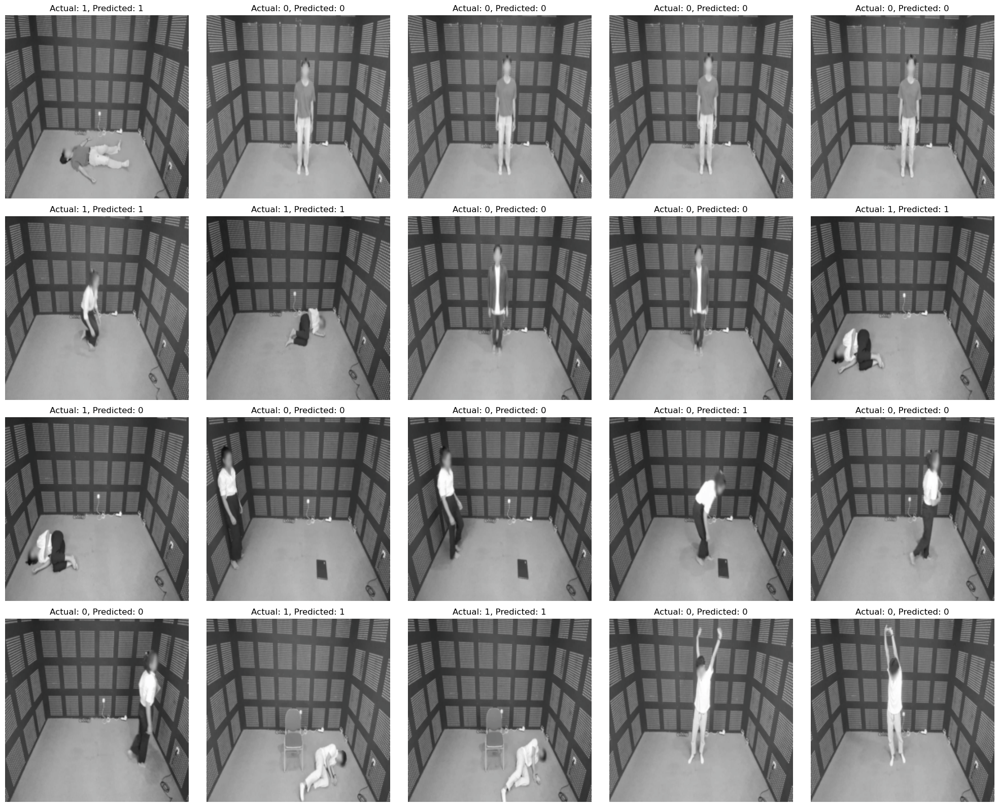

In [19]:
# --- Modified Evaluation Function with Random Sample Visualization ---

import matplotlib.pyplot as plt
import random

def evaluate_single_frame(model, single_frame_loader, device, stack_size=5, num_samples=20):
    """
    Evaluates the model on the single frame test dataset and visualizes random samples.
    
    Args:
        model (torch.nn.Module): Trained PyTorch model.
        single_frame_loader (DataLoader): DataLoader for the single frame test dataset.
        device (torch.device): Device to perform computations on.
        stack_size (int): Number of frames to stack for model input.
        num_samples (int): Number of random samples to visualize.
    """
    model.eval()
    correct = 0
    total = 0

    # Lists to store samples
    sample_images = []
    sample_actual = []
    sample_pred = []

    # Total number of samples in the dataset
    total_samples = len(single_frame_loader.dataset)

    # Randomly select indices for samples
    random_indices = set(random.sample(range(total_samples), min(num_samples, total_samples)))

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(single_frame_loader):
            # Check if current batch index is in the randomly selected indices
            if batch_idx in random_indices and len(sample_images) < num_samples:
                # Debugging: Cetak informasi batch
                print(f'Processing batch {batch_idx + 1} (Sample)')

                # Move data to the specified device
                images = images.to(device)
                labels = labels.to(device)

                frame = images[0]  # [C, H, W]

                # Membuat stack dengan mengulangi frame yang sama
                stacked_frames = frame.unsqueeze(1).repeat(1, stack_size, 1, 1)  # [C, stack_size, H, W]

                # Menambahkan dimensi batch: [1, C, stack_size, H, W]
                stacked_frames = stacked_frames.unsqueeze(0)

                # Pengecekan dimensi
                assert stacked_frames.dim() == 5, f"Expected 5D tensor, got {stacked_frames.dim()}D tensor"

                # Forward pass
                outputs = model(stacked_frames)
                _, predicted = torch.max(outputs, 1)

                # Debugging: Tampilkan prediksi dan label
                print(f'Predicted: {predicted.item()}, Actual: {labels.item()}')

                # Simpan prediksi dan label aktual
                sample_pred.append(predicted.item())
                sample_actual.append(labels.item())

                # Unnormalize dan simpan gambar untuk visualisasi
                img = frame.cpu().numpy()
                img = np.transpose(img, (1, 2, 0))  # [H, W, C]
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Unnormalize
                img = np.clip(img, 0, 1)
                sample_images.append(img)

                # Update akurasi
                total += 1
                correct += (predicted == labels).sum().item()

                # Remove the index to avoid selecting it again
                random_indices.remove(batch_idx)

                # Jika sudah mengumpulkan semua sampel, lanjutkan tanpa menyimpan lagi
                if len(sample_images) >= num_samples:
                    continue

            else:
                # Proses normal untuk menghitung akurasi
                images = images.to(device)
                labels = labels.to(device)

                frame = images[0]  # [C, H, W]

                # Membuat stack dengan mengulangi frame yang sama
                stacked_frames = frame.unsqueeze(1).repeat(1, stack_size, 1, 1)  # [C, stack_size, H, W]

                # Menambahkan dimensi batch: [1, C, stack_size, H, W]
                stacked_frames = stacked_frames.unsqueeze(0)

                # Pengecekan dimensi
                assert stacked_frames.dim() == 5, f"Expected 5D tensor, got {stacked_frames.dim()}D tensor"

                # Forward pass
                outputs = model(stacked_frames)
                _, predicted = torch.max(outputs, 1)

                # Update akurasi
                total += 1
                correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total if total > 0 else 0
    print(f'Accuracy of the model on single frame test sequences: {accuracy:.2f}%')

    # Plot random samples
    num_plots = min(num_samples, len(sample_images))
    cols = 5
    rows = (num_plots + cols - 1) // cols  # Ceiling division for rows

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for i in range(num_plots):
        axes[i].imshow(sample_images[i])
        axes[i].set_title(f'Actual: {sample_actual[i]}, Predicted: {sample_pred[i]}')
        axes[i].axis('off')

    # Hide any unused subplots
    for i in range(num_plots, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()
    
    
evaluate_single_frame(model, single_frame_test_loader, device, stack_size=5, num_samples=20)

Predictions made on 50 samples from the testing dataset.


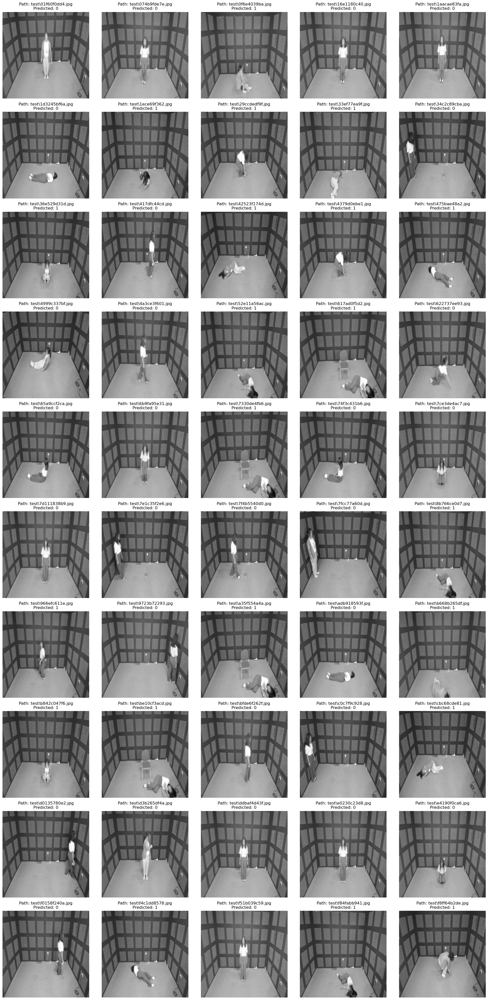

In [21]:
# --- Testing Dataset and DataLoader Setup with All Images from 'test' Folder ---

import os
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
from torchvision import transforms
import torch
import matplotlib.pyplot as plt
import random
from glob import glob

class TestingDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        """
        Dataset for testing single frames by loading all images from a directory.

        Args:
            image_dir (str): Path to the directory containing test images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        # Support common image extensions
        self.image_paths = glob(os.path.join(image_dir, '*'))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = -1  # Placeholder since labels are not provided

        # Load image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise ValueError(f"Image not found or unable to read: {img_path}")

        # Convert grayscale to RGB
        img = np.expand_dims(img, axis=2)  # [H, W, 1]
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)  # [H, W, 3]
        img = np.array(img, dtype=np.uint8)

        if self.transform:
            img = self.transform(img)  # [C, H, W]

        return img, label, img_path  # Return img_path for reference

# Define transformations similar to training
testing_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Adjusted for RGB
                         std=[0.229, 0.224, 0.225])
])

# Path to the test directory
test_directory = 'test'  # Replace with your actual test directory path

# Create TestingDataset
testing_dataset = TestingDataset(image_dir=test_directory, transform=testing_transform)

# Create DataLoader with batch_size=1 and without shuffle
testing_loader = DataLoader(testing_dataset, batch_size=1, shuffle=False)

# --- Evaluation Function with Random Sample Visualization ---

def evaluate_testing(model, testing_loader, device, stack_size=5, num_samples=20):
    """
    Evaluates the model on the testing dataset and visualizes random samples.

    Args:
        model (torch.nn.Module): Trained PyTorch model.
        testing_loader (DataLoader): DataLoader for the testing dataset.
        device (torch.device): Device to perform computations on.
        stack_size (int): Number of frames to stack for model input.
        num_samples (int): Number of random samples to visualize.
    """
    model.eval()
    correct = 0
    total = 0

    # Lists to store samples
    sample_images = []
    sample_preds = []
    sample_paths = []

    # Total number of samples in the dataset
    total_samples = len(testing_loader.dataset)

    # Ensure num_samples does not exceed total_samples
    num_samples = min(num_samples, total_samples)

    # Get random indices for sampling
    random_indices = set(random.sample(range(total_samples), num_samples))

    with torch.no_grad():
        for batch_idx, (images, labels, img_paths) in enumerate(testing_loader):
            # Move data to the specified device
            images = images.to(device)
            labels = labels.to(device)  # Placeholder labels (-1)
            
            frame = images[0]  # [C, H, W]

            # Create stack by repeating the same frame
            stacked_frames = frame.unsqueeze(1).repeat(1, stack_size, 1, 1)  # [C, stack_size, H, W]
            stacked_frames = stacked_frames.unsqueeze(0)  # [1, C, stack_size, H, W]

            # Dimension check
            assert stacked_frames.dim() == 5, f"Expected 5D tensor, got {stacked_frames.dim()}D tensor"

            # Forward pass
            outputs = model(stacked_frames)
            _, predicted = torch.max(outputs, 1)

            # Update predictions (assuming labels are not used for test set)
            # If labels are available, you can uncomment the following lines
            # total += labels.size(0)
            # correct += (predicted == labels).sum().item()

            # Save samples if index is in random_indices
            if batch_idx in random_indices and len(sample_images) < num_samples:
                # Unnormalize the image for visualization
                img = frame.cpu().numpy()
                img = np.transpose(img, (1, 2, 0))  # [H, W, C]
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Unnormalize
                img = np.clip(img, 0, 1)
                sample_images.append(img)
                sample_preds.append(predicted.item())
                sample_paths.append(img_paths[0])  # Get the image path

    # Since labels are placeholders, accuracy calculation is skipped
    # If actual labels are available, uncomment the accuracy calculation
    # accuracy = 100 * correct / total if total > 0 else 0
    # print(f'Accuracy of the model on testing dataset: {accuracy:.2f}%')

    print(f'Predictions made on {num_samples} samples from the testing dataset.')

    # Plot random samples
    num_plots = len(sample_images)
    cols = 5
    rows = (num_plots + cols - 1) // cols  # Ceiling division

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for i in range(num_plots):
        axes[i].imshow(sample_images[i])
        axes[i].set_title(f'Path: {sample_paths[i]}\nPredicted: {sample_preds[i]}')
        axes[i].axis('off')

    # Hide any unused subplots
    for i in range(num_plots, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# --- Evaluation Call ---

# Ensure you have set the device correctly, e.g.,
# device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the device
model.to(device)

# Perform evaluation and visualize 20 random samples
evaluate_testing(model, testing_loader, device, stack_size=5, num_samples=50)

Predictions saved to predictions.csv


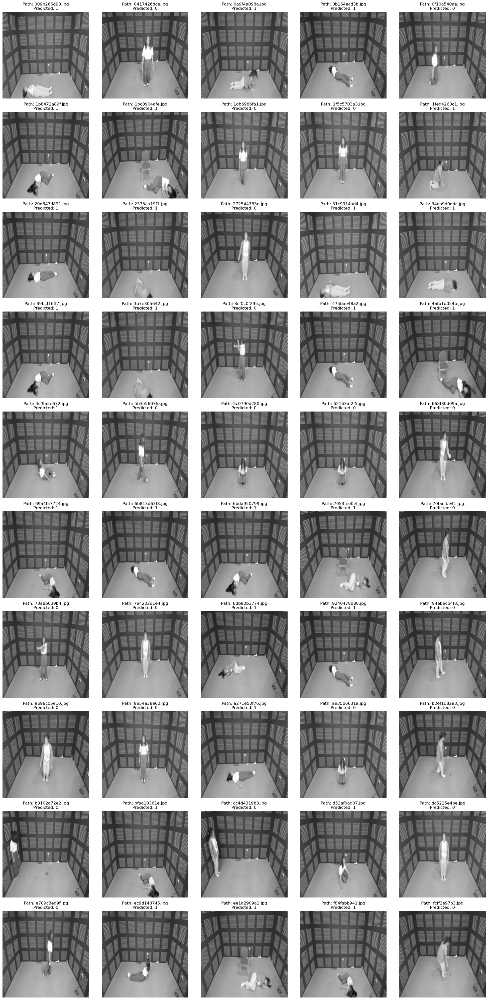

In [22]:
# --- Testing Dataset and DataLoader Setup with All Images from 'test' Folder ---

import os
from torch.utils.data import Dataset, DataLoader
import cv2
import numpy as np
from torchvision import transforms
import torch
import matplotlib.pyplot as plt
import random
from glob import glob
import pandas as pd  # Import pandas for CSV writing

class TestingDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        """
        Dataset for testing single frames by loading all images from a directory.

        Args:
            image_dir (str): Path to the directory containing test images.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        # Support common image extensions
        self.image_paths = glob(os.path.join(image_dir, '*'))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = -1  # Placeholder since labels are not provided

        # Load image in grayscale
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            raise ValueError(f"Image not found or unable to read: {img_path}")

        # Convert grayscale to RGB
        img = np.expand_dims(img, axis=2)  # [H, W, 1]
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)  # [H, W, 3]
        img = np.array(img, dtype=np.uint8)

        if self.transform:
            img = self.transform(img)  # [C, H, W]

        return img, label, img_path  # Return img_path for reference

# Define transformations similar to training
testing_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Adjusted for RGB
                         std=[0.229, 0.224, 0.225])
])

# Path to the test directory
test_directory = 'test'  # Replace with your actual test directory path

# Create TestingDataset
testing_dataset = TestingDataset(image_dir=test_directory, transform=testing_transform)

# Create DataLoader with batch_size=1 and without shuffle
testing_loader = DataLoader(testing_dataset, batch_size=1, shuffle=False)

# --- Evaluation Function with Random Sample Visualization and CSV Saving ---

def evaluate_testing(model, testing_loader, device, stack_size=5, num_samples=50, csv_path='predictions.csv'):
    """
    Evaluates the model on the testing dataset, visualizes random samples, and saves predictions to CSV.

    Args:
        model (torch.nn.Module): Trained PyTorch model.
        testing_loader (DataLoader): DataLoader for the testing dataset.
        device (torch.device): Device to perform computations on.
        stack_size (int): Number of frames to stack for model input.
        num_samples (int): Number of random samples to visualize.
        csv_path (str): Path to save the CSV file with predictions.
    """
    model.eval()

    # Lists to store all predictions and image filenames
    all_preds = []
    all_paths = []

    # Lists to store samples for visualization
    sample_images = []
    sample_preds = []
    sample_paths = []

    # Total number of samples in the dataset
    total_samples = len(testing_loader.dataset)

    # Ensure num_samples does not exceed total_samples
    num_samples = min(num_samples, total_samples)

    # Get random indices for sampling
    random_indices = set(random.sample(range(total_samples), num_samples))

    with torch.no_grad():
        for batch_idx, (images, labels, img_paths) in enumerate(testing_loader):
            # Move data to the specified device
            images = images.to(device)
            labels = labels.to(device)  # Placeholder labels (-1)

            frame = images[0]  # [C, H, W]

            # Create stack by repeating the same frame
            stacked_frames = frame.unsqueeze(1).repeat(1, stack_size, 1, 1)  # [C, stack_size, H, W]
            stacked_frames = stacked_frames.unsqueeze(0)  # [1, C, stack_size, H, W]

            # Dimension check
            assert stacked_frames.dim() == 5, f"Expected 5D tensor, got {stacked_frames.dim()}D tensor"

            # Forward pass
            outputs = model(stacked_frames)
            _, predicted = torch.max(outputs, 1)

            # Get the predicted label
            pred_label = predicted.item()

            # Get the image filename
            img_path = img_paths[0]
            img_filename = os.path.basename(img_path)

            # Append to all_preds and all_paths
            all_preds.append(pred_label)
            all_paths.append(img_filename)

            # Save samples if index is in random_indices and sample_images not yet full
            if batch_idx in random_indices and len(sample_images) < num_samples:
                # Unnormalize the image for visualization
                img = frame.cpu().numpy()
                img = np.transpose(img, (1, 2, 0))  # [H, W, C]
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Unnormalize
                img = np.clip(img, 0, 1)
                sample_images.append(img)
                sample_preds.append(pred_label)
                sample_paths.append(img_filename)

    # Create a DataFrame for all predictions
    df = pd.DataFrame({
        'id': all_paths,
        'label': all_preds
    })

    # Save to CSV
    df.to_csv(csv_path, index=False)

    print(f'Predictions saved to {csv_path}')

    # Plot random samples
    num_plots = len(sample_images)
    cols = 5
    rows = (num_plots + cols - 1) // cols  # Ceiling division

    fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
    axes = axes.flatten()

    for i in range(num_plots):
        axes[i].imshow(sample_images[i])
        axes[i].set_title(f'Path: {sample_paths[i]}\nPredicted: {sample_preds[i]}')
        axes[i].axis('off')

    # Hide any unused subplots
    for i in range(num_plots, len(axes)):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# --- Evaluation Call ---

# Ensure you have set the device correctly, e.g.,
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Move the model to the device
model.to(device)

# Perform evaluation and visualize 50 random samples, save predictions to 'predictions.csv'
evaluate_testing(model, testing_loader, device, stack_size=5, num_samples=50, csv_path='predictions.csv')

In [29]:
import pandas as pd

# Paths to the CSV files
predictions_path = "predictions.csv"
sample_submission_path = "sample_submission.csv"
merged_output_path = "merged_predictions.csv"

# Read the Predictions.csv
predictions = pd.read_csv(predictions_path)

# Read the Sample_Submission.csv
sample_submission = pd.read_csv(sample_submission_path)

# Perform inner join on 'id'
merged = pd.merge(sample_submission, predictions, on='id', how='inner')

# Select the required columns
merged = merged[['id', 'label_y']].rename(columns={'label_y': 'label'})

# Save the merged data to a new CSV file
merged.to_csv(merged_output_path, index=False)

print(f'Merged CSV saved to {merged_output_path}')

Merged CSV saved to merged_predictions.csv


In [28]:
merged

,id,label
0,4a73abcd02.jpg,0
1,266bdb8d70.jpg,0
2,1389b9fb66.jpg,0
3,7e1c35f2e6.jpg,0
4,8271bebf8f.jpg,1
...,...,...
2147,04f17ae096.jpg,0
2148,0d8031f778.jpg,1
2149,413ab0692a.jpg,0
2150,04a668d7be.jpg,0


In [25]:
predictions.head()

,id,label
0,00396960ae.jpg,0
1,004773d4e8.jpg,0
2,009b266d98.jpg,1
3,009ed56c89.jpg,0
4,00a16cb3ae.jpg,0


In [26]:
sample_submission.head()

,id,label
0,4a73abcd02.jpg,0
1,266bdb8d70.jpg,0
2,1389b9fb66.jpg,0
3,7e1c35f2e6.jpg,0
4,8271bebf8f.jpg,0
